# Analysis and Visualisation Part B: Tasks 3 - 5

In [1]:
import dataframeinfo as info
import dataframetransform as cleandata
import plotter as plots

## Load and check data

In [2]:
loans = cleandata.loans

In [3]:
loans.head()

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term_months,int_rate,instalment,grade,sub_grade,...,total_rec_late_fee,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,policy_code,application_type
0,38676116,41461848,8000,8000.0,8000.0,36.0,7.49,248.82,A,A4,...,0.0,0.0,0.0,2022-01-01,248.82,2022-02-01,2022-01-01,0.0,1,INDIVIDUAL
1,38656203,41440010,13200,13200.0,13200.0,36.0,6.99,407.52,A,A3,...,0.0,0.0,0.0,2022-01-01,407.52,2022-02-01,2022-01-01,0.0,1,INDIVIDUAL
2,38656154,41439961,16000,16000.0,16000.0,36.0,7.49,497.63,A,A4,...,0.0,0.0,0.0,2021-10-01,12850.16,2022-02-01,2021-10-01,0.0,1,INDIVIDUAL
3,38656128,41439934,15000,15000.0,15000.0,36.0,14.31,514.93,C,C4,...,0.0,0.0,0.0,2021-06-01,13899.67,2022-02-01,2021-06-01,0.0,1,INDIVIDUAL
4,38656121,41439927,15000,15000.0,15000.0,36.0,6.03,456.54,A,A1,...,0.0,0.0,0.0,2022-01-01,456.54,2022-02-01,2022-01-01,0.0,1,INDIVIDUAL


In [4]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54173 entries, 0 to 54227
Data columns (total 40 columns):
 #   Column                      Non-Null Count  Dtype        
---  ------                      --------------  -----        
 0   id                          54173 non-null  int64        
 1   member_id                   54173 non-null  int64        
 2   loan_amount                 54173 non-null  int64        
 3   funded_amount               54173 non-null  float64      
 4   funded_amount_inv           54173 non-null  float64      
 5   term_months                 54173 non-null  float64      
 6   int_rate                    54173 non-null  float64      
 7   instalment                  54173 non-null  float64      
 8   grade                       54173 non-null  category     
 9   sub_grade                   54173 non-null  category     
 10  employment_min_years        54173 non-null  float64      
 11  home_ownership              54173 non-null  category     
 12  annual_in

## Task 3

Calculate the projected loss of the loans marked as Charged Off.

Calculate the loss in revenue these loans would have generated for the company if they had finished their term. Visualise the loss projected over the remaining term of these loans.

(Will now work with the original dataframe, loans).

In [5]:
# Calculate expected revenue on all loans based on funded amount, interest rate and term. 
loans["expected_revenue"] = loans["funded_amount"] * (1 + (loans["int_rate"] / 100) * loans["term_months"])
tot_expected_rev = loans["expected_revenue"].sum()
# Create slice of charged off loans and calculate the total expected revenue of this subset. 
charged_off_loans = loans.loc[loans["loan_status"].isin(["Charged Off", "Does not meet the credit policy. Status:Charged Off"])]
co_expected_rev = charged_off_loans["expected_revenue"].sum()
print(f"Expected revenue co loans: {co_expected_rev}")
# Calculate the sum of all payments towatds charged off loans. 
co_tot_payment = charged_off_loans["total_payment"].sum()
print(f"Total payment co loans: {co_tot_payment}")
# Calculate the revenue lost due to loans being charged off.
loss = round(co_expected_rev - co_tot_payment, 2)
print(f"Revenue loss due to loans being charged off: {loss}")

Expected revenue co loans: 676597832.6693374
Total payment co loans: 39169755.063503474
Revenue loss due to loans being charged off: 637428077.61


In [6]:
co_loans_plots = plots.Plotter(charged_off_loans)
col_list = ["expected_revenue", "total_payment"]
co_loans_plots.box_plot_multi(col_list, "outliers", 500, 500)

In [7]:
co_loans_plots.box_plot_px("expected_revenue", "outliers", 300, 300)

In [8]:
co_loans_plots.box_plot_px("total_payment", "outliers", 300, 300)

I have really run out of time on this. For visualising the data, I'm wondering if there is a better way to show the projected loss. I would want to create some loop where I calculate the revenue step-wise over the rest of the term. So I would add one month at a time and update values in a dictionary for revenue, remaining payments and payment date (or maybe month of term for simplicity). Then I could plot revenue against month of term. 

## Task 4 - Possible loss

There are customers who are currently behind with their loan payments. This subset of customers represent a risk to company revenue.

What percentage do users' in this bracket currently represent as a percentage of all loans? Calculate the total amount of customers in this bracket and how much loss the company would incur their status was changed to Charged Off. What is the projected loss of these loans if the customer were to finish the full loans term?

If customers late on payments converted to Charged Off, what percentage of total expected revenue do these customers and the customers who have already defaulted on their loan represent?

In [9]:
# Re-load full df and create df of late payers.
loans = cleandata.loans
late_payers_df = loans.loc[loans["loan_status"].isin(["Late (31-120 days)", "Late (16-30 days)", "In Grace Period"])]
late_payers_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 951 entries, 17 to 46737
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype        
---  ------                      --------------  -----        
 0   id                          951 non-null    int64        
 1   member_id                   951 non-null    int64        
 2   loan_amount                 951 non-null    int64        
 3   funded_amount               951 non-null    float64      
 4   funded_amount_inv           951 non-null    float64      
 5   term_months                 951 non-null    float64      
 6   int_rate                    951 non-null    float64      
 7   instalment                  951 non-null    float64      
 8   grade                       951 non-null    category     
 9   sub_grade                   951 non-null    category     
 10  employment_min_years        951 non-null    float64      
 11  home_ownership              951 non-null    category     
 12  annual_inc

In [10]:
# Calculate the percentage of late payers. 
pct_late_payers = round((len(late_payers_df) / len(loans)) * 100, 2)
print(f"Late payers: {pct_late_payers}%")
late_payers = len(late_payers_df)
print(f"Number of late payers: {late_payers}")

Late payers: 1.76%
Number of late payers: 951


In [11]:
loans_info = info.DataFrameInfo(loans)

In [12]:
loans_info.value_counts_pct("loan_status")

Value              Count(%) 
 loan_status
Fully Paid                                             49.861
Current                                                35.566
Charged Off                                            10.274
Does not meet the credit policy. Status:Fully Paid      1.783
Late (31-120 days)                                      1.071
Does not meet the credit policy. Status:Charged Off     0.665
In Grace Period                                         0.489
Late (16-30 days)                                       0.196
Default                                                 0.096
Name: count, dtype: float64


In [13]:
# Create a column and calculate remaining_payment.
loans["remaining_payment"] = loans["funded_amount"] - loans["total_payment"]
loans[["funded_amount", "total_payment", "remaining_payment"]].head()

,funded_amount,total_payment,remaining_payment
0,8000.0,2982.51,5017.49
1,13200.0,4885.11,8314.89
2,16000.0,16824.54,-824.54
3,15000.0,15947.47,-947.47
4,15000.0,5473.46,9526.54


In [14]:
# Re-assign the late_payers_df to include the new column.
late_payers_df = loans.loc[loans["loan_status"].isin(["Late (31-120 days)", "Late (16-30 days)", "In Grace Period"])]
late_payers_df[["funded_amount", "total_payment", "remaining_payment"]].head()

,funded_amount,total_payment,remaining_payment
17,18825.0,3883.91,14941.09
140,15600.0,5394.11,10205.89
168,6000.0,1908.02,4091.98
171,15000.0,3764.14,11235.86
177,12725.0,4657.81,8067.19


In [15]:
# Calculate the sum of the unpaid amount for the late paying group. 
sum_remaining_late_payers = round(late_payers_df["remaining_payment"].sum(), 2)
print(f"Sum of amount that late payers have not yet paid: {sum_remaining_late_payers}")

Sum of amount that late payers have not yet paid: 4228128.07


In [16]:
# Create mask for late, defaulted and charged off loans. 
default_and_late_mask = loans["loan_status"].isin(["Late (31-120 days)", "Late (16-30 days)", "In Grace Period", "Default", "Charged Off", "Does not meet the credit policy. Status:Charged Off"])

In [17]:
# Create a df slice using the mask. Sum all unpaid monies in this slice. 
default_and_late_df = loans.loc[default_and_late_mask]
sum_late_n_default = round(default_and_late_df["remaining_payment"].sum(), 2)
print(f"Sum of amount that late payers, defaulters and charged off group have not paid: {sum_late_n_default}")

Sum of amount that late payers, defaulters and charged off group have not paid: 44067576.3


In [18]:
# Calculate the percentage of revenue represented by the above group. 
percentage_of_total_revenue = round((loans.loc[default_and_late_mask, "total_payment"].sum()/loans["total_payment"].sum())*100, 2)
print(percentage_of_total_revenue)

7.61


## Task 5

In this task you will be analysing the data to visualise the possible indicators that a customer will not be able to pay the loan.

You will want to compare columns which might be indicators against customers who have already stopped paying and customers who are currently behind on payments.

Here are some example columns that might indicate that a user might not pay the loan:

* Does the grade of the loan have effect on customers not paying?
* Is the purpose for the loan likely to have an effect?
* Does the home_ownership value contribute to the likelihood a customer won't pay?

To help identify which columns will be of interest, create a subset of these users.

Make the analysis and determine the columns are contributing to loans not being paid off and visualise any interesting indicators.

Compare these indicators between loans already charged off and loans which could change to charged off to check if these same factors apply to loans which have the potential to change to "Charged Off"

### High risk category vs low risk category

In [19]:
# Create a column for the high risk subcategory of loans, based on a selection from loan_status. 
loans["risk_group"] = loans["loan_status"].isin(["In Grace Period", "Late (31-120 days)", "Late (16-30 days)", "Default", "Charged Off", "Does not meet the credit policy. Status:Charged Off"])
loans.loc[loans["risk_group"] == True, "loan_status"].value_counts()

loan_status
Charged Off                                            5566
Late (31-120 days)                                      580
Does not meet the credit policy. Status:Charged Off     360
In Grace Period                                         265
Late (16-30 days)                                       106
Default                                                  52
Name: count, dtype: int64

In [20]:
# Check the inverse. 
loans.loc[~loans["risk_group"] == True, "loan_status"].value_counts()

loan_status
Fully Paid                                            27011
Current                                               19267
Does not meet the credit policy. Status:Fully Paid      966
Name: count, dtype: int64

In [21]:
# Convert booleans to values "high risk" and "low risk".
values_dict = {True: "high risk", False: "low risk"}
loans["risk_group"] = loans["risk_group"].replace(values_dict)
loans[["risk_group", "loan_status"]].head(15)

,risk_group,loan_status
0,low risk,Current
1,low risk,Current
2,low risk,Fully Paid
3,low risk,Fully Paid
4,low risk,Current
5,low risk,Current
6,low risk,Fully Paid
7,high risk,Charged Off
8,low risk,Current
9,low risk,Current


In [22]:
# Check data type.
print(loans["risk_group"].dtypes)

object


In [23]:
# Convert to category.
loans["risk_group"] = loans["risk_group"].astype("category")

In [24]:
# Create the column percentage recovered for reference. 
loans["percentage_recovered"] = (loans["total_payment"] / loans["funded_amount"]) * 100
loans["percentage_recovered"].head()

0     37.281
1     37.008
2    105.153
3    106.316
4     36.490
Name: percentage_recovered, dtype: float64

In [25]:
# Create an instance of the Plotter class
loans_plots = plots.Plotter(loans)

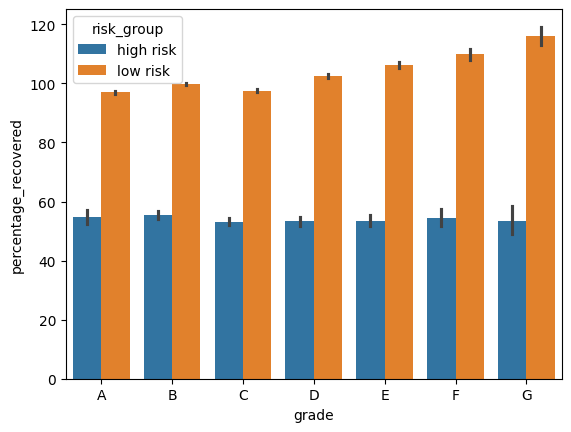

In [26]:
# See how the risk groups compare. Plot percentage recovered against grade for the two risk groups.
loans_plots.sns_barplot("grade", "percentage_recovered", "risk_group")

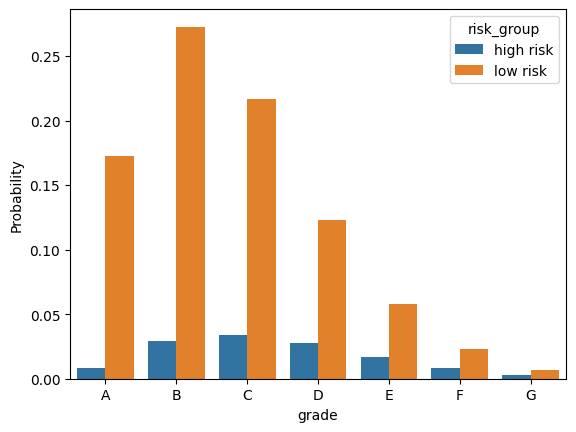

In [27]:
# Create a dpd plot for grade and risk group to show the relative counts of each grade for each risk group. 
plot_list = ["grade", "risk_group"]
loans_plots.dpd_multi_plot(plot_list, x_rot=0)

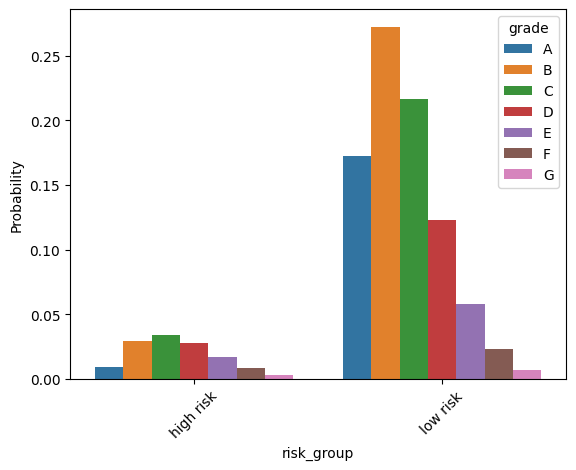

In [28]:
plot_list = ["risk_group", "grade"]
loans_plots.dpd_multi_plot(plot_list, x_rot=45)
# In the high risk group, the most common loan grade is C, while it is B in the low risk group. 

In [29]:
# Create a stacked probability bar plot with marginal box. 
loans_plots.dual_prob_plot("grade", "risk_group")
# The below indicates that, for example, grade G loans have the highest proportion of high risk customers (32% of grade G loans are in the high risk group), and grade A loans have the lowest proportion of high risk customers (5%). 
# On average, the lower (alphabet) grade loans are lower risk.  

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



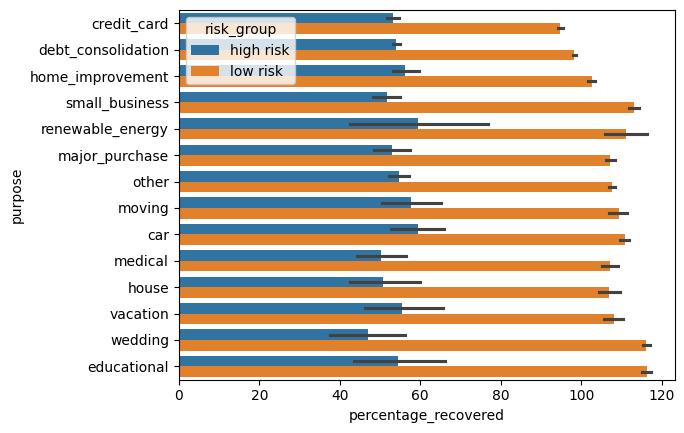

In [30]:
loans_plots.sns_barplot("percentage_recovered", "purpose", "risk_group")

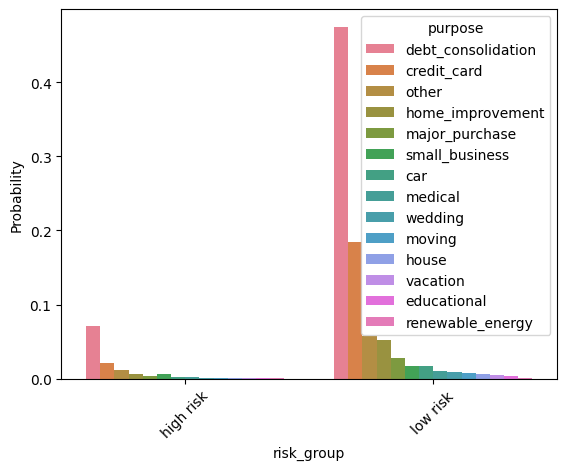

In [31]:
plot_list = ["risk_group", "purpose"]
loans_plots.dpd_multi_plot(plot_list, x_rot=45)

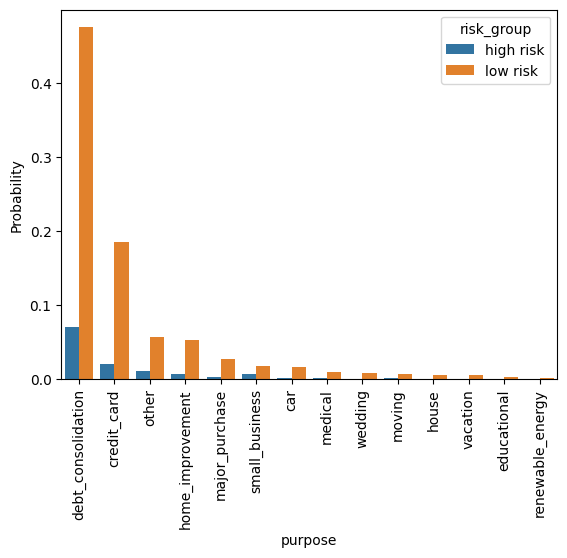

In [32]:
plot_list = ["purpose", "risk_group"]
loans_plots.dpd_multi_plot(plot_list, x_rot=90)

In [33]:
loans_plots.dual_prob_plot("purpose", "risk_group", marginal=None)
# Where the loan purpose is small_business, there is a greater chance of defaulting, since 27% of small business loans are in the high risk group, followed by educational and moving. 
# The lowest risk purpose is wedding. 

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [34]:
loans_plots.dual_prob_plot("purpose", "risk_group", barnorm=None, marginal=None)

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [35]:
loans_plots.dual_prob_plot("home_ownership", "risk_group", marginal=None)
# Lack of data ("NONE") for home ownership is associated with high risk loans. While nearly 90% of morgatged customers are in the low risk group.
# The data suggests that customers with a mortgage are less likely to pay late or default on their loans.  

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [36]:
loans_plots.dual_prob_plot("home_ownership", "risk_group", barnorm=None, marginal=None)
# However "NONE" and "OTHER" groups for home_ownership represent a very small portion of the data, so this might not be a reliable indicator. 

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [37]:
loans_plots.dual_prob_plot("employment_min_years", "risk_group")
# The relative frequency of high risk customers does not vary significantly with employment length. 

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [38]:
loans_plots.dual_prob_plot("employment_min_years", "risk_group", barnorm=None)

/usr/local/lib/python3.11/site-packages/plotly/express/_core.py:2044: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



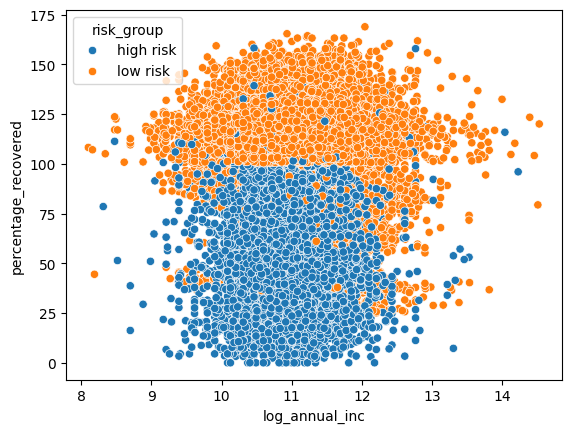

In [39]:
# Create a column "log_annual_inc" and plot percentage recovery against it, for the two risk groups. 
loans_transform = cleandata.DataFrameTransform(loans)
loans["log_annual_inc"] = loans_transform.log_transform_ind_col("annual_inc")
loans_plots.scatter("log_annual_inc", "percentage_recovered", "risk_group")

### Indicators comparison late/default compared to already charged off.

In [40]:
# Create a column for the late and defaulted subcategory of loans, based on a selection from loan_status. 
loans["status_umbrella"] = loans["loan_status"].isin(["In Grace Period", "Late (31-120 days)", "Late (16-30 days)", "Default"])
loans.loc[loans["status_umbrella"] == True, "loan_status"].value_counts()

loan_status
Late (31-120 days)    580
In Grace Period       265
Late (16-30 days)     106
Default                52
Name: count, dtype: int64

In [41]:
# Convert booleans to values "late_or_default" and "other".
values_dict = {True: "Late or Default", False: "other"}
loans["status_umbrella"] = loans["status_umbrella"].replace(values_dict)
# Update Charged Off to Charged Off in status_ubbrella.
loans.loc[loans["loan_status"].isin(["Charged Off", "Does not meet the credit policy. Status:Charged Off"]), "status_umbrella"] = "Charged Off"
# Update remaining "other" to Good. 
dict_2 = {"other": "Good"}
loans["status_umbrella"] = loans["status_umbrella"].replace(dict_2)
loans[["status_umbrella", "loan_status"]].head(20)

,status_umbrella,loan_status
0,Good,Current
1,Good,Current
2,Good,Fully Paid
3,Good,Fully Paid
4,Good,Current
5,Good,Current
6,Good,Fully Paid
7,Charged Off,Charged Off
8,Good,Current
9,Good,Current


In [42]:
# Create a separate dataframe for the low risk group.
low_risk_df = loans.loc[loans["risk_group"] == "low risk"]
low_risk_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47244 entries, 0 to 54227
Data columns (total 46 columns):
 #   Column                      Non-Null Count  Dtype        
---  ------                      --------------  -----        
 0   id                          47244 non-null  int64        
 1   member_id                   47244 non-null  int64        
 2   loan_amount                 47244 non-null  int64        
 3   funded_amount               47244 non-null  float64      
 4   funded_amount_inv           47244 non-null  float64      
 5   term_months                 47244 non-null  float64      
 6   int_rate                    47244 non-null  float64      
 7   instalment                  47244 non-null  float64      
 8   grade                       47244 non-null  category     
 9   sub_grade                   47244 non-null  category     
 10  employment_min_years        47244 non-null  float64      
 11  home_ownership              47244 non-null  category     
 12  annual_in

In [43]:
# Create a separate dataframe for the high risk group.
high_risk_df = loans.loc[loans["risk_group"] == "high risk"]
high_risk_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6929 entries, 7 to 54190
Data columns (total 46 columns):
 #   Column                      Non-Null Count  Dtype        
---  ------                      --------------  -----        
 0   id                          6929 non-null   int64        
 1   member_id                   6929 non-null   int64        
 2   loan_amount                 6929 non-null   int64        
 3   funded_amount               6929 non-null   float64      
 4   funded_amount_inv           6929 non-null   float64      
 5   term_months                 6929 non-null   float64      
 6   int_rate                    6929 non-null   float64      
 7   instalment                  6929 non-null   float64      
 8   grade                       6929 non-null   category     
 9   sub_grade                   6929 non-null   category     
 10  employment_min_years        6929 non-null   float64      
 11  home_ownership              6929 non-null   category     
 12  annual_inc

In [44]:
low_risk_plots = plots.Plotter(low_risk_df)
high_risk_plots = plots.Plotter(high_risk_df)

In [45]:
# Plot the data from the high risk group only, comparing the relative frequency of customers for each loan purpose who are charged off or at rosk of this (late or default).
high_risk_plots.dual_prob_plot("purpose", "status_umbrella", marginal=None)
# In the high risk group, educational and wedding purposes of the loan represent the highest relative frequencies of already charged off customers, compared to late or default. 
# These are followed by car and small business, which represent higher proportions of the total data set, so could be stronger indicators. 

In [46]:
high_risk_plots.dual_prob_plot("purpose", "status_umbrella", marginal=None, barnorm=None)

In [47]:
loans_plots.dual_prob_plot("purpose", "status_umbrella", marginal=None)

In [48]:
high_risk_plots.dual_prob_plot("grade", "status_umbrella", marginal=None)

In [49]:
high_risk_plots.dual_prob_plot("home_ownership", "status_umbrella", marginal=None)

In [50]:
high_risk_plots.dual_prob_plot("employment_min_years", "status_umbrella")

### Other factors

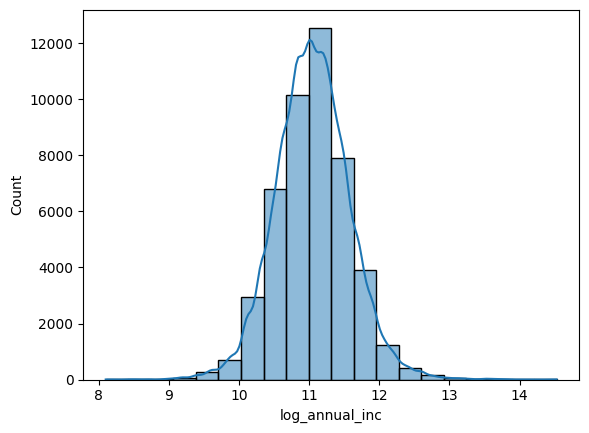

In [51]:
low_risk_plots.histogram("log_annual_inc")

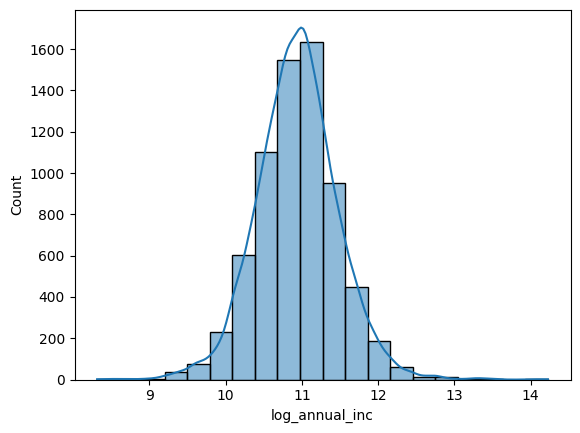

In [52]:
high_risk_plots.histogram("log_annual_inc")
# Income distribution is similar for low and high risk groups. 

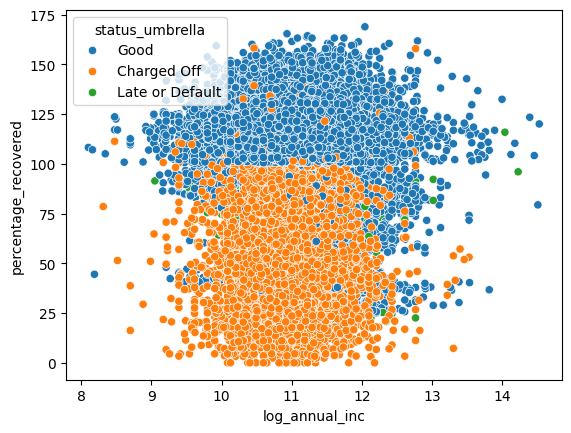

In [53]:
loans_plots.scatter("log_annual_inc", "percentage_recovered", "status_umbrella")

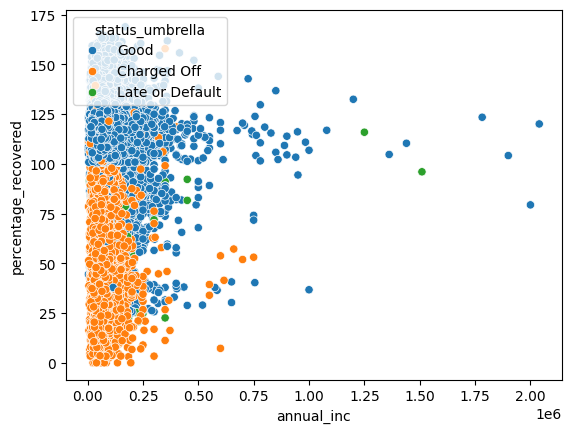

In [54]:
loans_plots.scatter("annual_inc", "percentage_recovered", "status_umbrella")

In [55]:
high_risk_plots.dual_prob_plot("log_annual_inc", "status_umbrella")

In [56]:
loans_plots.dual_prob_plot("log_annual_inc", "status_umbrella")

In [57]:
loans_plots.dual_prob_plot("int_rate", "status_umbrella")
# Lower interest rates are associated with lower rates of default and charge off. END. 